# Quantifying Mtb on a single-cell level across large tissue slices

First work on a single example to determine thresholds then iterate over all slices.

In [4]:
import os

In [9]:
import os
import glob
from pathlib import Path
import shutil # <--- REMAINS REQUIRED
# The rest of your necessary imports...

# --- Configuration ---
QU_PATH_SOURCE_BASE = Path("/Volumes/lab-gutierrezm/home/shared/Shared - Baptiste Pradel/Histology/rep2/QuPath analysis")
DEST_BASE = Path("/Volumes/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/whole_slice/rep2")

# --- Execution ---
for mouse_folder in QU_PATH_SOURCE_BASE.glob("Mouse */"):
    # ... (Mouse number extraction logic remains the same)
    try:
        mouse_num = int(mouse_folder.name.split()[-1])
    except ValueError:
        print(f"Skipping folder with unexpected name format: {mouse_folder.name}")
        continue

    dest_qu_path_dir = DEST_BASE / f"mouse_{mouse_num}" / "qu_path"

    if not dest_qu_path_dir.exists():
        print(f"Destination structure missing, skipping mouse_{mouse_num}. Please ensure {dest_qu_path_dir} exists.")
        continue

    qpdata_files = list(mouse_folder.glob("**/*.qpdata"))

    if not qpdata_files:
        print(f"No .qpdata files found for mouse_{mouse_num} in source.")
        continue

    # 4. Copy each .qpdata file
    copy_count = 0
    for qpdata_fn in qpdata_files:
        target_fn = dest_qu_path_dir / qpdata_fn.name

        try:
            # --- CODE MODIFICATION: Replaced shutil.move with shutil.copy2 ---
            shutil.copy2(str(qpdata_fn), str(target_fn))
            copy_count += 1
            # --- END MODIFICATION ---
        except Exception as e:
            # The cross-device error is not relevant now since copy is the intended action,
            # but we keep the error handler for other potential I/O issues.
            print(f"ERROR copying {qpdata_fn.name}: {e}")

    print(f"\n--- Copied {copy_count} .qpdata files to {dest_qu_path_dir.name} for mouse_{mouse_num} ---")

print("\n✅ All specified .qpdata files have been replicated.")


--- Copied 3 .qpdata files to qu_path for mouse_5 ---

--- Copied 3 .qpdata files to qu_path for mouse_13 ---

--- Copied 3 .qpdata files to qu_path for mouse_6 ---

--- Copied 1 .qpdata files to qu_path for mouse_2 ---

--- Copied 1 .qpdata files to qu_path for mouse_7 ---

--- Copied 3 .qpdata files to qu_path for mouse_10 ---

--- Copied 2 .qpdata files to qu_path for mouse_3 ---

--- Copied 3 .qpdata files to qu_path for mouse_14 ---

--- Copied 3 .qpdata files to qu_path for mouse_4 ---

--- Copied 3 .qpdata files to qu_path for mouse_11 ---

--- Copied 1 .qpdata files to qu_path for mouse_1 ---

--- Copied 1 .qpdata files to qu_path for mouse_8 ---
Skipping folder with unexpected name format: Mouse 12(temp 20251118)

--- Copied 3 .qpdata files to qu_path for mouse_9 ---

✅ All specified .qpdata files have been replicated.


In [7]:
for i in range(1,17):
    os.makedirs(f'/Volumes/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/whole_slice/rep2/mouse_{i}/qu_path')

### copying rep2

In [11]:
matching_vsi_fn

'20251109_40X_Mouse16_Timer_PZA-RIF_20251109_09.vsi'

In [12]:
from pathlib import Path

# --- CONFIGURATION ---

# 1. MAPPING: Target Mouse ID (int) -> Unique Substring in VSI Filename (str)
# This mapping is used to match the VSI file to its correct destination mouse_i folder.
MOUSE_MAPPING = {
    12: '12b',
    13: '5693',
    14: '5692',
    15: 'Mouse15',
    16: 'Mouse16'
}

# 2. SOURCE DIRECTORY: Full, local mount path on your Ubuntu desktop for the cloud storage.
SOURCE_BASE_DIR = Path("/Volumes/lab-gutierrezm/home/shared/Shared - Baptiste Pradel/Histology/rep2")

# 3. DESTINATION DIRECTORY: The local path on your Ubuntu desktop for the Synology server mount.
DEST_BASE_DIR = Path("/Volumes/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/whole_slice/rep2")


# --- RSYNC COMMAND GENERATION ---

rsync_commands = []
found_files = set()

print("\n--- Generating Rsync Commands ---")

# --- DYNAMIC FILE DISCOVERY ---
required_substrings = list(MOUSE_MAPPING.values())

try:
    # Use glob to find all actual VSI files in the source directory
    vsi_paths = list(SOURCE_BASE_DIR.glob('*.vsi'))
    
    # Filter: Only keep file names that contain one of the required substrings
    VSI_FILE_LIST = [
        p.name for p in vsi_paths 
        if p.is_file() and any(sub in p.name for sub in required_substrings)
    ]
    
    print(f"Found {len(vsi_paths)} total .vsi files. Filtered to {len(VSI_FILE_LIST)} matching the mouse mappings.")

except Exception as e:
    print(f"Error accessing source directory ({SOURCE_BASE_DIR}): {e}. Check mount point and permissions.")
    VSI_FILE_LIST = [] # Fail gracefully if the directory cannot be accessed

# -------------------------------

for mouse_num, substring in MOUSE_MAPPING.items():
    
    # 1. Determine the destination directory
    # e.g., /Volumes/OPERA3/.../rep2/mouse_12/vsi
    dest_path = DEST_BASE_DIR / f"mouse_{mouse_num}" / "vsi"
    
    # Ensure the mouse directory exists in the destination path
    if not dest_path.exists():
        # This will create the required mouse_i/vsi directory if it was not created
        dest_path.mkdir(parents=True, exist_ok=True) 

    # 2. Find the matching VSI filename
    matching_vsi_fn = None
    for filename in VSI_FILE_LIST:
        if substring in filename:
            # Found the match for this mouse
            matching_vsi_fn = filename
            found_files.add(filename)
            break
            
    if matching_vsi_fn:
        # 3. Construct the full source paths
        vsi_file_source = SOURCE_BASE_DIR / matching_vsi_fn
        
        # The accompanying folder name is the VSI filename enclosed in underscores
        # 3a. Strip the .vsi extension using Path().stem
        stripped_fn = Path(matching_vsi_fn).stem
        
        # The accompanying folder name is the VSI filename (stripped) enclosed in underscores
        vsi_folder_name = f"_{stripped_fn}_"
        vsi_folder_source = SOURCE_BASE_DIR / vsi_folder_name
        
        # rsync destination is the vsi directory itself, ensuring the files/folders land inside it.
        dest_target = f"{dest_path}/"
        
        # 4. Generate the robust rsync commands (two commands per mouse)
        
        # Command 1: Transfer the VSI file
        vsi_cmd = (
            f'rsync -avz --progress "{vsi_file_source}" "{dest_target}"'
        )
        rsync_commands.append(vsi_cmd)
        
        # Command 2: Transfer the VSI accompanying folder
        vsi_folder_cmd = (
            f'rsync -avz --progress "{vsi_folder_source}" "{dest_target}"'
        )
        rsync_commands.append(vsi_folder_cmd)
        
        print(f"Match found for mouse_{mouse_num} ({substring}): Generated commands for VSI file and accompanying folder.")
    else:
        print(f"⚠️ Warning: No VSI file containing substring '{substring}' found in VSI_FILE_LIST for mouse_{mouse_num}.")

print("\n--- Rsync Script for Sequential Transfer ---")
print("# Run these commands one at a time for maximum stability and resumability.")
print("# Each mouse requires two separate rsync commands: one for the .vsi file and one for the corresponding folder.")
print("\n# --- START RSYNC COMMANDS ---")

for cmd in rsync_commands:
    print(cmd)

print("# --- END RSYNC COMMANDS ---")

print(f"\n✅ Total transfer operations queued: {len(rsync_commands)}.")


--- Generating Rsync Commands ---
Found 18 total .vsi files. Filtered to 5 matching the mouse mappings.
Match found for mouse_12 (12b): Generated commands for VSI file and accompanying folder.
Match found for mouse_13 (5693): Generated commands for VSI file and accompanying folder.
Match found for mouse_14 (5692): Generated commands for VSI file and accompanying folder.
Match found for mouse_15 (Mouse15): Generated commands for VSI file and accompanying folder.
Match found for mouse_16 (Mouse16): Generated commands for VSI file and accompanying folder.

--- Rsync Script for Sequential Transfer ---
# Run these commands one at a time for maximum stability and resumability.
# Each mouse requires two separate rsync commands: one for the .vsi file and one for the corresponding folder.

# --- START RSYNC COMMANDS ---
rsync -avz --progress "/Volumes/lab-gutierrezm/home/shared/Shared - Baptiste Pradel/Histology/rep2/20251109_40X_Mouse12b_Timer_PZA-RIF_20251110_11.vsi" "/Volumes/OPERA3/Nathan/

In [6]:
import os
import glob
from pathlib import Path

# Define the base directory
BASE_DIR = Path("/Volumes/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/whole_slice/rep2")

# Iterate over mouse directories 1 through 16
for i in range(1, 17):
    mouse_dir = BASE_DIR / f"mouse_{i}"

    if not mouse_dir.exists():
        print(f"Directory not found, skipping: {mouse_dir}")
        continue

    # Define the new target directories
    new_zarr_dir = mouse_dir / "zarr"
    new_vsi_dir = mouse_dir / "vsi"

    # Create the new subdirectories
    os.makedirs(new_zarr_dir, exist_ok=True)
    os.makedirs(new_vsi_dir, exist_ok=True)
    print(f"\n--- Processing {mouse_dir.name} ---")

    # Get all contents of the current mouse directory
    # Use glob to find all files and directories, excluding the newly created ones
    contents = [
        item for item in mouse_dir.glob("*")
        if item.name not in ["zarr", "vsi"] and item.name != new_zarr_dir.name and item.name != new_vsi_dir.name
    ]

    # --- Move Logic ---
    zarr_moved_count = 0
    other_moved_count = 0

    for item in contents:
        # 1. Check if the item is an existing zarr directory
        # This checks for directories that end with '.zarr' or are named 'zarr'
        if item.is_dir() and (item.name == "zarr" or item.name.endswith(".zarr")):
            # Move the directory and all its contents into the new 'zarr' subdirectory
            # We use os.system for 'mv' to handle the directory move recursively
            # Note: If 'item.name' is already 'zarr' and it's not the 'new_zarr_dir', it means
            # we found an existing zarr folder, so we move its contents.
            if item.name == "zarr":
                # Move contents of the existing 'zarr' directory into the newly created 'zarr' directory
                for sub_item in item.iterdir():
                    os.system(f'mv "{sub_item}" "{new_zarr_dir}"')
                    zarr_moved_count += 1
                # Remove the now empty original 'zarr' directory
                item.rmdir()
            else:
                # Move the entire .zarr directory into the new 'zarr' directory
                os.system(f'mv "{item}" "{new_zarr_dir}"')
                zarr_moved_count += 1
        
        # 2. Otherwise, move the item (files, other dirs like 'qu_path', 'vsi' files, etc.) into the 'vsi' subdirectory
        else:
            os.system(f'mv "{item}" "{new_vsi_dir}"')
            other_moved_count += 1

    print(f"  > Zarr-related items moved to 'zarr': {zarr_moved_count}")
    print(f"  > Other items moved to 'vsi': {other_moved_count}")

print("\n✅ Data restructuring complete.")


--- Processing mouse_1 ---
  > Zarr-related items moved to 'zarr': 1
  > Other items moved to 'vsi': 2

--- Processing mouse_2 ---
  > Zarr-related items moved to 'zarr': 1
  > Other items moved to 'vsi': 2

--- Processing mouse_3 ---
  > Zarr-related items moved to 'zarr': 1
  > Other items moved to 'vsi': 2

--- Processing mouse_4 ---
  > Zarr-related items moved to 'zarr': 1
  > Other items moved to 'vsi': 2

--- Processing mouse_5 ---
  > Zarr-related items moved to 'zarr': 1
  > Other items moved to 'vsi': 2

--- Processing mouse_6 ---
  > Zarr-related items moved to 'zarr': 0
  > Other items moved to 'vsi': 2

--- Processing mouse_7 ---
  > Zarr-related items moved to 'zarr': 1
  > Other items moved to 'vsi': 2

--- Processing mouse_8 ---
  > Zarr-related items moved to 'zarr': 1
  > Other items moved to 'vsi': 2

--- Processing mouse_9 ---
  > Zarr-related items moved to 'zarr': 1
  > Other items moved to 'vsi': 2

--- Processing mouse_10 ---
  > Zarr-related items moved to 'za

In [1]:
import zarr
import glob
import napari
import dask.array as da
from pathlib import Path

In [3]:
zarr_addresses = glob.glob('/mnt/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/whole_slice/mouse_*/zarr/2025*.zarr')
zarr_addresses = natsorted([fn for fn in zarr_addresses if 'notebook' not in fn])

results = []

for zarr_address in tqdm(zarr_addresses):
    try:
        # Load data
        images = da.from_zarr(f"{zarr_address}/0/0")
        masks = da.from_zarr(f"{zarr_address}/labels/ground_truth_mtb/0")
        
        # Compute max projections lazily
        max_proj_ch1 = images[0, 1, :, :, :].max(axis=0)
        max_proj_ch2 = images[0, 2, :, :, :].max(axis=0)
        
        # Compute results
        max_proj_ch1_computed = max_proj_ch1.compute()
        max_proj_ch2_computed = max_proj_ch2.compute()
        masks_computed = masks.compute()
        masks_computed = label(masks_computed)
        # Use regionprops to efficiently compute measurements for all regions at once
        props = regionprops_table(masks_computed, 
                                 intensity_image=max_proj_ch1_computed,
                                 properties=['label', 'mean_intensity', 'area'])
        
        props_ch2 = regionprops_table(masks_computed,
                                     intensity_image=max_proj_ch2_computed,
                                     properties=['mean_intensity'])
        
        # Combine results
        for i, label_id in enumerate(props['label']):
            results.append({
                'zarr_address': os.path.basename(zarr_address),
                'region_id': label_id,
                'mean_intensity_ch1': props['mean_intensity'][i],
                'mean_intensity_ch2': props_ch2['mean_intensity'][i],
                'area': props['area'][i]
            })
    except:
        print(zarr_address, ' failed')
df_results = pd.DataFrame(results)

ERROR! Session/line number was not unique in database. History logging moved to new session 3768


  0%|          | 0/11 [00:00<?, ?it/s]

/mnt/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/whole_slice/mouse_6/zarr/20250901_40X_TimerMtb_BP_mice5_mice6_mice7_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250903_5556.zarr  failed
/mnt/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/whole_slice/mouse_8/zarr/20250821_40X_TimerMtb_BP_mice8_mice9_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250822_5549.zarr  failed


In [4]:
df_results

,zarr_address,region_id,mean_intensity_ch1,mean_intensity_ch2,area
0,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,1,0.000000,0.000000,23.0
1,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,2,0.000000,0.000000,39.0
2,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,3,120.315068,110.698630,146.0
3,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,4,883.984615,250.476923,65.0
4,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,5,0.000000,0.000000,91.0
...,...,...,...,...,...
26999,20250901_40X_TimerMtb_BP_mice11_DAPI_TimerG_Ti...,239,137.860759,158.700422,237.0
27000,20250901_40X_TimerMtb_BP_mice11_DAPI_TimerG_Ti...,240,109.032258,114.903226,62.0
27001,20250901_40X_TimerMtb_BP_mice11_DAPI_TimerG_Ti...,241,302.518325,407.848168,191.0
27002,20250901_40X_TimerMtb_BP_mice11_DAPI_TimerG_Ti...,242,110.038760,117.930233,129.0


In [17]:
df_results

NameError: name 'df_results' is not defined

In [6]:
df_results.to_pickle('/mnt/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/sc_results.pkl')

# Load previously calculated results

In [2]:
import pandas as pd

In [3]:
# df = pd.read_pickle('/mnt/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/sc_results.pkl')
df = pd.read_pickle('/Volumes/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/sc_results.pkl')

In [4]:
df

,zarr_address,region_id,mean_intensity_ch1,mean_intensity_ch2,area
0,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,1,0.000000,0.000000,23.0
1,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,2,0.000000,0.000000,39.0
2,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,3,120.315068,110.698630,146.0
3,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,4,883.984615,250.476923,65.0
4,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,5,0.000000,0.000000,91.0
...,...,...,...,...,...
26999,20250901_40X_TimerMtb_BP_mice11_DAPI_TimerG_Ti...,239,137.860759,158.700422,237.0
27000,20250901_40X_TimerMtb_BP_mice11_DAPI_TimerG_Ti...,240,109.032258,114.903226,62.0
27001,20250901_40X_TimerMtb_BP_mice11_DAPI_TimerG_Ti...,241,302.518325,407.848168,191.0
27002,20250901_40X_TimerMtb_BP_mice11_DAPI_TimerG_Ti...,242,110.038760,117.930233,129.0


## Integrate condition information

In [5]:
df['zarr_address'].unique()

array(['20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250814_5375.zarr',
       '20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250901_5551.zarr',
       '20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250901_5552.zarr',
       '20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250901_5553.zarr',
       '20250901_40X_TimerMtb_BP_mice5_mice6_mice7_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250903_5555.zarr',
       '20250901_40X_TimerMtb_BP_mice5_mice6_mice7_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250903_5557.zarr',
       '20250821_40X_TimerMtb_BP_mice8_mice9_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250822_5550.zarr',
       '20250901_40X_TimerMtb_BP_mice11_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250902_5555.zarr'],
      dtype=object)

# Plot

In [22]:
import seaborn as sns

In [23]:
df['timer_ratio'] = df['mean_intensity_ch1']/df['mean_intensity_ch2']

<Axes: xlabel='timer_ratio', ylabel='zarr_address'>

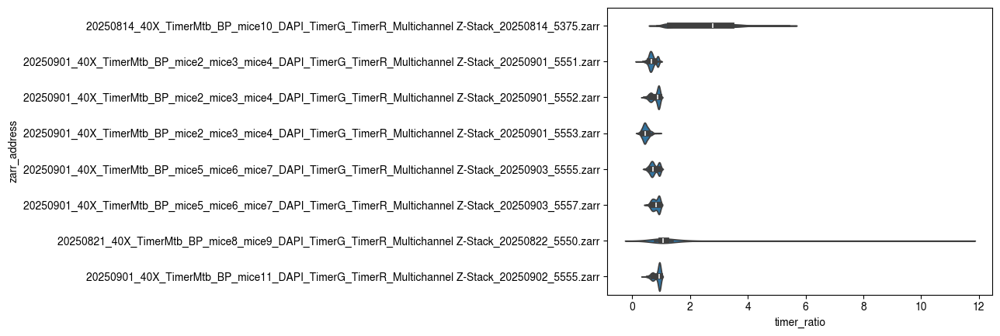

In [25]:
sns.violinplot(data=df, y='zarr_address', x='timer_ratio')

In [7]:
df_results.groupby('zarr_address')

## Heatmap visualisation

In [6]:
df = pd.read_pickle('/mnt/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/sc_results_w_bb.pkl')

In [7]:
df['timer_ratio'] = df['mean_intensity_ch1']/df['mean_intensity_ch2']

In [37]:
for i, group in df.groupby('zarr_address'):
    print(group['zarr_address'].iloc[0])
    print(len(group))

20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250814_5375.zarr
23226
20250821_40X_TimerMtb_BP_mice8_mice9_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250822_5550.zarr
309
20250901_40X_TimerMtb_BP_mice11_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250902_5555.zarr
243
20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250901_5551.zarr
1912
20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250901_5552.zarr
396
20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250901_5553.zarr
455
20250901_40X_TimerMtb_BP_mice5_mice6_mice7_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250903_5555.zarr
354
20250901_40X_TimerMtb_BP_mice5_mice6_mice7_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250903_5557.zarr
109


In [39]:
subset_df = df[df['zarr_address']=='20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250901_5551.zarr']

In [40]:
subset_df

,zarr_address,region_id,mean_intensity_ch1,mean_intensity_ch2,area,bbox_rmin,bbox_rmax,bbox_cmin,bbox_cmax,timer_ratio
16762,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,1,669.458333,1154.916667,72.0,12,28,24285,24311,0.579659
16763,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,2,394.212121,602.606061,33.0,31,46,25260,25278,0.654179
16764,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,3,613.163636,943.381818,55.0,43,59,25134,25166,0.649963
16765,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,4,737.836957,1462.576087,92.0,46,69,24763,24787,0.504478
16766,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,5,257.228070,396.228070,57.0,47,64,27340,27364,0.649192
...,...,...,...,...,...,...,...,...,...,...
18669,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,1908,114.215094,123.305660,265.0,31757,31790,30643,30690,0.926276
18670,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,1909,113.428571,122.548701,308.0,31840,31882,30387,30422,0.925580
18671,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,1910,317.565401,491.603376,237.0,32828,32869,16364,16390,0.645979
18672,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,1911,116.030357,128.687500,560.0,32887,32934,16392,16436,0.901644


In [11]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import numpy as np # Used only for dummy data if file fails

In [8]:
df['x'] = (df['bbox_rmax'] - df['bbox_rmin'])//2 + df['bbox_rmin']		
df['y'] = (df['bbox_cmax'] - df['bbox_cmin'])//2 + df['bbox_cmin']		

In [9]:
df

,zarr_address,region_id,mean_intensity_ch1,mean_intensity_ch2,area,bbox_rmin,bbox_rmax,bbox_cmin,bbox_cmax,timer_ratio,x,y
0,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,1,0.000000,0.000000,23.0,1267,1279,32515,32543,NaN,1273,32529
1,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,2,0.000000,0.000000,39.0,2019,2038,21217,21233,NaN,2028,21225
2,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,3,120.315068,110.698630,146.0,2433,2459,22886,22916,1.086870,2446,22901
3,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,4,883.984615,250.476923,65.0,2496,2524,32883,32908,3.529206,2510,32895
4,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,5,0.000000,0.000000,91.0,2500,2521,9392,9419,NaN,2510,9405
...,...,...,...,...,...,...,...,...,...,...,...,...
26999,20250901_40X_TimerMtb_BP_mice11_DAPI_TimerG_Ti...,239,137.860759,158.700422,237.0,36480,36503,21175,21213,0.868686,36491,21194
27000,20250901_40X_TimerMtb_BP_mice11_DAPI_TimerG_Ti...,240,109.032258,114.903226,62.0,36519,36544,16639,16654,0.948905,36531,16646
27001,20250901_40X_TimerMtb_BP_mice11_DAPI_TimerG_Ti...,241,302.518325,407.848168,191.0,36544,36574,20714,20741,0.741743,36559,20727
27002,20250901_40X_TimerMtb_BP_mice11_DAPI_TimerG_Ti...,242,110.038760,117.930233,129.0,36584,36601,14265,14296,0.933084,36592,14280


In [15]:
for i, group in df.groupby('zarr_address'):
    print(i, group)
    break

20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250814_5375.zarr                                             zarr_address  region_id  \
0      20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...          1   
1      20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...          2   
2      20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...          3   
3      20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...          4   
4      20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...          5   
...                                                  ...        ...   
26756  20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...       6460   
26757  20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...       6461   
26758  20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...       6462   
26759  20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...       6463   
26760  20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...       6464   

       mean_intensity_ch1  mean_intensity_ch2   area  bb

In [21]:
expt_ID = i.split('_')[-1].split('.')[0]

'5375'

In [35]:
# Imports needed for this operation
import os
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FormatStrFormatter
# import pandas as pd # Assuming 'df' is a loaded DataFrame

# --- Code Modifications ---

# 1. Define physical scale constants based on metadata.
# From "Physical pixel size" (0.1625) and "units" (10^-6m^1).
PIXEL_SIZE_UM = 0.1625  # micrometres per pixel
PIXEL_SCALE_MM = PIXEL_SIZE_UM / 1000.0  # millimetres per pixel

# Create the output directory if it doesn't exist.
os.makedirs('heatmaps', exist_ok=True)

for i, group in df.groupby('zarr_address'):
    expt_ID = i.split('_')[-1].split('.')[0]
    
    # Use the specified style context
    plt.style.use('seaborn-v0_8-whitegrid')
    
    # 2. Define the target number of bins for the grid.
    TARGET_BINS = 100
    
    # 3. Calculate spatial extent in pixels.
    x_min, x_max = group['x'].min(), group['x'].max()
    y_min, y_max = group['y'].min(), group['y'].max()
    
    data_range = max(x_max - x_min, y_max - y_min) + 1e-6
    # BIN_SIZE is calculated in pixels
    BIN_SIZE = data_range / TARGET_BINS
    
    if BIN_SIZE < 1e-5:
        print(f"Skipping {expt_ID}: Data has zero spatial extent.")
        continue

    # 4. Create binned coordinate columns (still in pixel-based bin indices).
    group['y_bin'] = ((-group['x'] - x_min) // BIN_SIZE).astype(int)
    group['x_bin'] = ((group['y'] - y_min) // BIN_SIZE).astype(int)
    
    # 5. Aggregate the data by the new bins.
    binned_data = group.groupby(['y_bin', 'x_bin'])['timer_ratio'].mean()
    
    # 6. Pivot the data into a 2D matrix.
    heatmap_matrix = binned_data.unstack(level='x_bin')
    
    # 7. Relabel the axes to reflect physical units (mm).
    # First, calculate the pixel coordinate for the center/edge of the bin.
    pixel_coords_x = (heatmap_matrix.columns * BIN_SIZE + x_min)
    pixel_coords_y = (heatmap_matrix.index * BIN_SIZE + y_min)
    
    # Now, convert pixel coordinates to millimetres.
    # The index/columns are now float values representing mm.
    heatmap_matrix.columns = pixel_coords_x * PIXEL_SCALE_MM
    heatmap_matrix.index = pixel_coords_y * PIXEL_SCALE_MM
    
    # 8. Plot the heatmap.
    plt.figure(figsize=(12, 10))
    
    # Calculate dynamic tick frequency.
    x_tick_frequency = max(1, len(heatmap_matrix.columns) // 10)
    y_tick_frequency = max(1, len(heatmap_matrix.index) // 10)
    
    ax = sns.heatmap(
        heatmap_matrix,
        annot=False,
        cmap='PiYG',
        linewidths=0.5,
        linecolor='#cccccc',
        cbar_kws={'label': 'Mean Timer Ratio'},
        xticklabels=x_tick_frequency,
        yticklabels=y_tick_frequency
    )
    
    # 9. Format the tick labels to 2 decimal places (for mm).
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    
    # 10. Apply styling preferences.
    physical_bin_size_mm = BIN_SIZE * PIXEL_SCALE_MM
    title = (
        f'Dynamic Heatmap (ID: {expt_ID})\n'
        f'Physical Bin Size: {physical_bin_size_mm:.2f} x {physical_bin_size_mm:.2f} mm'
    )
    ax.set_title(title)
    ax.set_xlabel('X Coordinate (mm)')
    ax.set_ylabel('Y Coordinate (mm)')
    ax.tick_params(axis='x', rotation=90)
    
    # Set background and apply despine
    ax.set_facecolor('white')
    sns.despine(offset=10, trim=True)
    
    # Ensure layout is tight and save the figure.
    plt.tight_layout()
    save_path = f'heatmaps/dynamic_heatmap_mm_ID{expt_ID}.png'
    plt.savefig(save_path)
    plt.close() # Close figure to free memory
    print(f"Dynamic heatmap saved as '{save_path}'")

Dynamic heatmap saved as 'heatmaps/dynamic_heatmap_mm_ID5375.png'
Dynamic heatmap saved as 'heatmaps/dynamic_heatmap_mm_ID5550.png'
Dynamic heatmap saved as 'heatmaps/dynamic_heatmap_mm_ID5555.png'
Dynamic heatmap saved as 'heatmaps/dynamic_heatmap_mm_ID5551.png'
Dynamic heatmap saved as 'heatmaps/dynamic_heatmap_mm_ID5552.png'
Dynamic heatmap saved as 'heatmaps/dynamic_heatmap_mm_ID5553.png'
Dynamic heatmap saved as 'heatmaps/dynamic_heatmap_mm_ID5555.png'
Dynamic heatmap saved as 'heatmaps/dynamic_heatmap_mm_ID5557.png'


## Images

In [60]:
zarr_address = glob.glob('/mnt/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/whole_slice/mouse_*/zarr/*5551.zarr')[0]

In [61]:
print(zarr_address)

/mnt/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/whole_slice/mouse_2/zarr/20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250901_5551.zarr


/home/dayn/miniconda3/envs/godspee/lib/python3.11/site-packages/napari/_vispy/layers/scalar_field.py:197: UserWarning: data shape (41702, 58291) exceeds GL_MAX_TEXTURE_SIZE 32768 in at least one axis and will be downsampled. Rendering is currently in 2D mode.
  warnings.warn(


In [62]:

# --- load image (full-res level) ---
img = da.from_zarr(f"{zarr_address}/0/0")    # adjust path if your top-level differs

# # --- load label ---
# lbl = da.from_zarr(f"{zarr_address}/labels/ground_truth_mtb/0")


In [63]:
img.shape

(1, 3, 11, 37555, 49997)

In [65]:
viewer = napari.Viewer(title = 'heatmap')
viewer.open(Path(zarr_address,'0'), channel_axis=1)   # napari-ome-zarr plugin
# viewer.open(Path(zarr_address, 'labels', 'ground_truth_mtb'))


# # --- show in napari ---
# viewer = napari.Viewer()
# viewer.add_image(img, name="image")
# viewer.add_labels(lbl, name="ground_truth_mtb")
# napari.run()


[<Image layer '0' at 0x771d6a7b3ad0>,
 <Image layer '0 [1]' at 0x771ccc47bf10>,
 <Image layer '0 [2]' at 0x771ccc4a6d50>]

In [67]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
import matplotlib.cm as cm # Needed for 'rocket' cmap

In [68]:
# --- 1. Define Constants ---

# The exact dimensions of your source image
IMG_HEIGHT = 37555
IMG_WIDTH = 49997

# The spatial bin size, as specified in your code.
BIN_SIZE = 500

# The global transparency of the overlay (0.0 to 1.0)
OVERLAY_ALPHA = 0.7

# The DPI for rendering.
FIG_DPI = 100

# --- 2. Load Data ---
# (DataFrame 'df' is assumed to be loaded and in scope, as requested)
print(f"Using pre-loaded DataFrame with BIN_SIZE={BIN_SIZE}")

# --- 3. Bin Data and Create Full-Sized Matrix ---

# Create binned coordinate columns
df['x_bin'] = df['x'] // BIN_SIZE
df['y_bin'] = df['y'] // BIN_SIZE

# Group by the new bin indices and calculate the mean
binned_data = df.groupby(['y_bin', 'x_bin'])['timer_ratio'].mean()

# Pivot the data into a 2D matrix
heatmap_matrix = binned_data.unstack(level='x_bin')

# Define the full index range based on image dimensions
num_bins_x = int(np.ceil(IMG_WIDTH / BIN_SIZE))
num_bins_y = int(np.ceil(IMG_HEIGHT / BIN_SIZE))

x_bins_index = pd.RangeIndex(start=0, stop=num_bins_x, name='x_bin')
y_bins_index = pd.RangeIndex(start=0, stop=num_bins_y, name='y_bin')

# Reindex the matrix to ensure it has the full
# (num_bins_y, num_bins_x) shape, filling missing bins with NaN
heatmap_matrix = heatmap_matrix.reindex(index=y_bins_index, columns=x_bins_index)

# Get the raw NumPy array for plotting
ratio_matrix = heatmap_matrix.values

# Get data range for the colormap, ignoring NaNs
min_val = np.nanmin(ratio_matrix)
max_val = np.nanmax(ratio_matrix)

print(f"Created binned matrix of shape: {ratio_matrix.shape}")

# --- 4. Configure Colormap ---

# Get the 'rocket' colormap object
custom_cmap = cm.get_cmap('rocket')

# CRITICAL: Instruct the colormap to render NaN values as fully transparent
# We copy the colormap to avoid modifying the global matplotlib state
custom_cmap = custom_cmap.copy()
custom_cmap.set_bad(color=(0, 0, 0, 0))

# --- 5. Configure Figure and Render Image ---

# Calculate the figure size in inches to match the exact pixel dimensions
fig_width_inches = IMG_WIDTH / FIG_DPI
fig_height_inches = IMG_HEIGHT / FIG_DPI

# Create the figure
plt.figure(figsize=(fig_width_inches, fig_height_inches), dpi=FIG_DPI)

# Create an axes object that fills the entire figure (no padding)
ax = plt.axes([0, 0, 1, 1])

# Use imshow to render the binned matrix
# 'interpolation="nearest"' ensures sharp, blocky bins
# 'aspect="auto"' stretches the bins to fill the axes
ax.imshow(
    ratio_matrix,
    cmap=custom_cmap,
    alpha=OVERLAY_ALPHA,
    interpolation='nearest',
    aspect='auto',
    vmin=min_val,
    vmax=max_val
)

# Turn off all axes, labels, and ticks
ax.axis('off')

# --- 6. Save the Transparent PNG ---

# 'transparent=True' makes the figure background transparent
# 'pad_inches=0' and 'bbox_inches="tight"' remove all whitespace
plt.savefig(
    'heatmap_overlay_rocket.png',
    transparent=True,
    pad_inches=0,
    bbox_inches='tight',
    dpi=FIG_DPI
)

print(f"Transparent overlay saved as 'heatmap_overlay_rocket.png' ({IMG_WIDTH}x{IMG_HEIGHT} pixels)")

Using pre-loaded DataFrame with BIN_SIZE=500
Created binned matrix of shape: (76, 100)


/tmp/ipykernel_56322/595955366.py:55: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  custom_cmap = cm.get_cmap('rocket')


Transparent overlay saved as 'heatmap_overlay_rocket.png' (49997x37555 pixels)


In [69]:
from skimage import io

In [70]:
heatmap = io.imread('heatmap_overlay_rocket.png')

DecompressionBombError: Image size (1877637335 pixels) exceeds limit of 178956970 pixels, could be decompression bomb DOS attack.